# Задача "Построить набор маршрутов, приблизительно равных по времени"

- Нужно построить набор маршрутов приблизительно равных по времени.
- В одну точку надо попасть только один раз
- В один маршрут входит от 20 до 30 точек (значение может варьироваться между ними)
- Первая точка любого маршрута определена переменными FIRST_POINT_LAT (широта) и FIRST_POINT_LNG (долгота)

Из дополнений к задаче
- Основной критерий - минимальное время, за которое развезут товар по точкам (ПВЗ)
- Для простоты считаем груз безразмерными и пренебрегаем возможным весом и размерами
- Нужно учитывать время возврата на базу 
- Водитель тратит около 15-20 минут на точку
- Время работы водителя должно быть 6-7 часов
- Разрешено использовать платные дороги

## Алгоритм решения задачи 

__Посылки:__
- Требуется найти НАИМЕНЬШЕЕ число маршрутов, укладывающихся в условия задачи
- Таким образом НЕТ необходимости проходить через ВСЕ точки. А это значит, что не будет гамильтоновых циклов
- Маршруты начинаются и заканчиваются в БАЗОВОЙ точке (склад, ID=0)
- Основной тезис: а вот если прямо сейчас вернуться на базу – как быстро это можно сделать?
- Из двух маршрутов с одинаковой длительностью, лучше тот в котором больше точек (эеономическая эффективность)
- Тогда из всех точек лучшим алгоритмом является тот, который вернет наименьшее количество маршрутов

__Гипотезы__
- Кратчайший маршрут из базы в базу, проходящий, как минимум через одну точку: это маршрут через точку, которая является ближайшей к базе
- Если мы уберем этот маршрут, как самый оптимальный, то следующий оптимальный будет уже через слкдующую ближайшую точку к базе
- Таким образом, если учитывать ограничения, нам надо составлять маршруты из ближайших к базе точек: уменьшать МИНИМАЛЬНОСТЬ

__Алгоритм:__
- Записываем в маршрут базовую точку
- Из всех точек ищем самую ближайшую к базе (так как граф у нас взвешенный и ориентированый – ищем точку, сумма расстояний до которой из базы и от которой в до базы будет минимальным)
- Проверяем маршрут с найденной точкой на условия задачи
- Если маршрут удовлетворяем условиям:
    - Записываем точку в маршрут, убираем ее из оставщихся точек
    - Повторяем для оставшихся точек
- Если маршрут с найденной не удовлетворяет условиям:
    - Записываем в конец маршрута базовую точку
    - Начинаем новый маршрут с начальной базовой точкой



## Ход работ

- Загрузка датасетов (матрицы расстояний, координат точек, результатов для сравнения)
- Написание функционала для реализации алгоритма
- Сравнение с другими наборами маршрутов (из базовой в любую другую точки и из базоыой в базовую, выболненые методом "Гибридный генетический поиск")
- Рекоммендации к использованию

## Материалы, изученные в ходе исследования

- https://arxiv.org/abs/2012.10384
- https://github.com/TheoLvs/reinforcement-learning/blob/master/5.%20Delivery%20Optimization/README.md
- https://habr.com/ru/articles/209610/
- https://www.geeksforgeeks.org/traveling-salesman-problem-using-genetic-algorithm/
- https://ru.wikipedia.org/wiki/%D0%97%D0%B0%D0%B4%D0%B0%D1%87%D0%B0_%D0%BA%D0%BE%D0%BC%D0%BC%D0%B8%D0%B2%D0%BE%D1%8F%D0%B6%D1%91%D1%80%D0%B0#:~:text=%D0%97%D0%B0%D0%B4%D0%B0%D1%87%D0%B0%20%D0%BA%D0%BE%D0%BC%D0%BC%D0%B8%D0%B2%D0%BE%D1%8F%D0%B6%D1%91%D1%80%D0%B0%20(%D0%B8%D0%BB%D0%B8%20TSP%20%D0%BE%D1%82,%D0%BF%D0%BE%D1%81%D0%BB%D0%B5%D0%B4%D1%83%D1%8E%D1%89%D0%B8%D0%BC%20%D0%B2%D0%BE%D0%B7%D0%B2%D1%80%D0%B0%D1%82%D0%BE%D0%BC%20%D0%B2%20%D0%B8%D1%81%D1%85%D0%BE%D0%B4%D0%BD%D1%8B%D0%B9%20%D0%B3%D0%BE%D1%80%D0%BE%D0%B4.

## Импорт модулей

In [19]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import folium
from folium.plugins import GroupedLayerControl
import random



## Дополнительные переменные

In [2]:
MAX_HOURS = 7
STOP_MINUTES = 15

ROUTES_STATS_DF_COL_NAMES = ['total_duration', 'begin_duration', 'body_duration', 'end_duration', 'stops_duration', 'num_of_points']
ROUTES_STATS_DF_FLOAT_COLS = ['total_duration', 'begin_duration', 'body_duration', 'end_duration', 'stops_duration']
ROUTES_STATS_DF_INT_COLS = ['num_of_points']

POINTS_DF_COL_NAMES = ['ID', 'lat', 'lon']

BASE_POINT_LAT = 55.386871
BASE_POINT_LON = 37.588898

## Импорт матрицы времени (duration)

In [3]:
matrix = np.load('matrix.npy')

matrix

array([[   0., 5684., 1737., ..., 2121., 1861., 2898.],
       [5458.,    0., 5075., ..., 4523., 4582., 3876.],
       [1620., 5111.,    0., ..., 1263., 1560., 1806.],
       ...,
       [2084., 4594., 1415., ...,    0., 1061., 1122.],
       [1893., 4634., 1763., ..., 1149.,    0., 1373.],
       [2729., 4070., 1768., ...,  886., 1386.,    0.]])

## Импорт точек

In [4]:
points_df = pd.read_csv('points.csv', index_col=0)
points_df.head()

,ID,lat,lon
0,33,56.323548,36.718808
1,125,55.619616,37.752718
2,139,54.917372,37.419732
3,169,55.855128,38.446205
4,212,55.690080,37.858530


In [5]:
points_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3713 entries, 0 to 3712
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      3713 non-null   int64  
 1   lat     3713 non-null   float64
 2   lon     3713 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 116.0 KB


In [6]:
points_df.loc[2526-1]

# [38.757725, 55.403042]

ID     169711.000000
lat        55.403042
lon        38.757725
Name: 2525, dtype: float64

In [7]:
points_df.describe()

,ID,lat,lon
count,3713.000000,3713.000000,3713.000000
mean,145832.666038,55.703477,37.661949
std,77069.107261,0.276349,0.487118
min,33.000000,54.434627,35.491835
25%,109892.000000,55.589228,37.456873
50%,151041.000000,55.724885,37.605939
75%,204012.000000,55.855265,37.858922
max,312452.000000,56.762163,40.074797


## Импорт датасетов для сравнения

### От базы до ПОСЛЕДНЕЙ точки (от Славы)

In [26]:
compared_data = None

with open('vout.json') as json_file:
    compared_data = json.load(json_file)
 
    # Print the type of data variable
    print("Type:", type(compared_data))
 
    print(len(compared_data['routes']))

Type: <class 'dict'>
222


### От базы до БАЗЫ точки (от Славы)

In [27]:
compared_data_to_base = None

with open('out_b2b.json') as json_file:
    compared_data_to_base = json.load(json_file)
 
    # Print the type of data variable
    print("Type:", type(compared_data_to_base))
 
    print(len(compared_data_to_base['routes']))

Type: <class 'dict'>
269


In [28]:
compared_routes_to_base_stats = pd.DataFrame([], columns=ROUTES_STATS_DF_COL_NAMES)
compared_routes_to_base_stats[ROUTES_STATS_DF_FLOAT_COLS] = compared_routes_to_base_stats[ROUTES_STATS_DF_FLOAT_COLS].astype(float)
compared_routes_to_base_stats[ROUTES_STATS_DF_INT_COLS] = compared_routes_to_base_stats[ROUTES_STATS_DF_INT_COLS].astype(int)

## Работа

In [124]:
class RoutesCalc:
    _matrix = None
    _points = None
    _routes = np.array([])
    _points_df = None
    _r_indices = []
    r = []
    _stats_df = None

    STOP_DURATION = 15 * 60 # Minutes in seconds
    MAX_DURATION = 7 * 60 * 60 # Hours in seconds
    INF = 10000000.0

    def reset(self):
        self._matrix = None
        self._points = None
        self._routes = np.array([])
        self._points_df = None
        self._r_indices = []
        self.r = []
        self._stats_df = None
        
    
    def __init__(self, matrix, points_df):
        self.reset()
        self._matrix = matrix
        self._points = np.arange(0, len(self._matrix[0]), 1, dtype=int)
        self._points_df = points_df
    
    # получаем ближайшую точку к базовой
    def _get_point(self, points, begin, end):
        durations = np.full(len(self._matrix[0]), self.INF)
    
        for point in points:
            duration_from_begin = matrix[begin, point]
            duration_to_end = matrix[point, end]
            durations[point] = duration_from_begin + duration_to_end
    
        min_duration_index = np.argmin(durations)
        duration = durations[min_duration_index]
    
        return (min_duration_index, duration, matrix[begin, min_duration_index], matrix[min_duration_index, end])

    # Поиск маршрута по методу "Следующая ближайщая точка к базовой"
    def run_1_base_routes_search(self):
        next_points = self._points
        

        while len(next_points) > 0:

            route = np.array([0])
            r = np.array([0])
            total_duration = 0
            route_duration = 0
            stops_duration = 0
            continue_search = True
    
            while (total_duration < self.MAX_DURATION) & continue_search == True:
                from_point = route[-1]
                mask = np.ones(len(self._points), dtype=bool)
                u = route
    
                if len(self._routes) > 0:
                    u =  np.unique(np.concatenate((self._routes, route))).astype(int)
        
                mask[u] = False
                next_points = self._points[mask]  
        
                next_point, duration, duration_from_begin, duration_to_end = self._get_point(next_points, from_point, 0)

                # Если не выполняются условия - заканчиваем маршрут, записываем в конец маршрута базовую точку
                if total_duration + duration + self.STOP_DURATION > self.MAX_DURATION:
                    route = np.append(route, 0)
                    r = np.append(r, 0)
                    continue_search = False
                    break

                # Если условия выполняются – включаем точку в маршрут
                else:
                    route_duration = route_duration + duration_from_begin
                    stops_duration = stops_duration + self.STOP_DURATION
                    total_duration = route_duration + stops_duration
            
                    route = np.append(route, next_point)
                    r = np.append(r, next_point - 1)
    
            self._routes = np.append(self._routes, route).astype(int)
            self.r.append(r)
            # print(route)
            # print()

        self.check_routes()
        print('Всего маршрутов: ', len(self.r))

    def check_routes(self):
        a = np.array([])

        # Проверка пересечений точек (чтобы одна точка входила только в один маршрут)
        for route in self.r:
            a = np.append(a, route[1:-1])
        
        print('Всего точек: ', len(a))
        print('Уникальных точек точек: ', len(np.unique(a)))

    # Сохраняем сравниваемый датасет 
    def save_r_from_json(self, obj, drop_end_point=False):
        for i, route in enumerate(obj['routes']):
            r = np.array([])
            r_indices = ([])
       
            for j, step in enumerate(route['steps']):
                # print(step)

                if drop_end_point == True:
                    if step['type'] != 'end':
                        if step['location_index'] == 0:
                            r = np.append(r, 0).astype(int)
                        else:
                            r = np.append(r, step['location_index'] - 1).astype(int)
                else:
                    if step['location_index'] == 0:
                            r = np.append(r, 0).astype(int)
                    else:
                        r = np.append(r, step['location_index'] - 1).astype(int)
                    
                
            self.r.append(r)

    # Рисуем карту
    def render(self, fake_coords_koeff=1.0):

        m = folium.Map(location=(BASE_POINT_LAT, BASE_POINT_LON))
        rs = []
        angle = 0
        groups = []

        for route_idx, route in enumerate(self.r):
            r = []
            fg = folium.FeatureGroup(name=f'Маршрут № {route_idx}')
            m.add_child(fg)
            coordinates = []
            
            it = np.nditer(route, flags=['f_index'])
            for point in it:
    
                lat = BASE_POINT_LAT
                lon = BASE_POINT_LON
                tooltip = ''
    
                if it.index == 0:
                    tooltip = 'Старт (0)'
                    kw = {"prefix": "fa", "color": "orange", "icon": "flag-checkered", "tooltip": "Старт"}
        
                    r.append({
                        "order": it.index,
                        "point_id": 0,
                    })
    
                if it.index == route.size - 1:
                    
                    kw = {"prefix": "fa", "color": "red", "icon": "flag-checkered", "tooltip": "Финиш"}

                    if point == 0:
                        tooltip = 'Стоп (0)'
                        r.append({
                            "order": it.index,
                            "point_id": 0,
                        })
                    else:
                        tooltip=f'ID={id} ({it.index})'
                        r.append({
                            "order": it.index,
                            "point_id": point,
                        })
                        lat = self._points_df.loc[point_idx, 'lat']
                        lon = self._points_df.loc[point_idx, 'lon']
    
                if it.index > 0 and (it.index < route.size - 1):
                    point_idx = point # - 1
                    lat = self._points_df.loc[point_idx, 'lat']
                    lon = self._points_df.loc[point_idx, 'lon']
                    id = self._points_df.loc[point_idx, 'ID']
                    kw = {"prefix": "fa", "color": "blue", "icon": "circle-dot"}
                    tooltip=f'ID={id} ({it.index})'
                    r.append({
                        "order": it.index,
                        "point_id": id,
                    })
    
                icon = folium.Icon(angle=angle, **kw)
                folium.Marker(location=[lat * fake_coords_koeff, lon * fake_coords_koeff], icon=icon, tooltip=tooltip).add_to(fg)
    
    
                coordinates.append([lat * fake_coords_koeff, lon * fake_coords_koeff])
                
            rs.append(r)    
    
            folium.PolyLine(
                locations=coordinates,
                color="#FF0000",
                weight=5,
                tooltip=route_idx,
            ).add_to(fg)

            groups.append(fg)
        
        GroupedLayerControl(
            groups={'groups1': groups},
            collapsed=False,
        ).add_to(m)

        display(m)


    # Выводим статистику
    def stats(self):
        self._stats_df = pd.DataFrame([], columns=ROUTES_STATS_DF_COL_NAMES)
        self._stats_df[ROUTES_STATS_DF_FLOAT_COLS] = self._stats_df[ROUTES_STATS_DF_FLOAT_COLS].astype(float)
        self._stats_df[ROUTES_STATS_DF_INT_COLS] = self._stats_df[ROUTES_STATS_DF_INT_COLS].astype(int)

        for route in self.r:
            d = 0
            begin_duration = 0
            end_duration = 0
            body_duration = 0
            s = 0
            
            for point in range(0, len(route) - 1):
                
                point_index = route[point] + 1
                next_point_index = route[point + 1] + 1
                
                
                if point == 0:
                    point_index = route[point]
                

                if point == len(route) - 2:
                    if route[point + 1] == 0:
                        next_point_index = 0
                    else:
                        next_point_index = route[point + 1] + 1
        
                current_dur = matrix[point_index , next_point_index]
        
                d = d + current_dur
        
                if point == 0:
                    begin_duration = current_dur
        
                if point == len(route) - 2:
                    end_duration = current_dur
        
                if point > 0 and point < len(route) - 2:
                    body_duration = body_duration + current_dur
        
            total_duration = d / 3600
            body_duration = body_duration / 3600
            begin_duration = begin_duration / 3600
            end_duration = end_duration / 3600
            s = ((len(route) - 2) * self.STOP_DURATION) / 3600
        
                
            self._stats_df.loc[len(self._stats_df.index)] = [total_duration + s, begin_duration, body_duration, end_duration, s, len(route)] 
    
        self._stats_df['num_of_points'] = self._stats_df[ROUTES_STATS_DF_INT_COLS].astype(int)
        self._stats_df[ROUTES_STATS_DF_FLOAT_COLS] = self._stats_df[ROUTES_STATS_DF_FLOAT_COLS].astype(float).round(2)
        
        # display(routes_stats.head())
        display(self._stats_df.describe())
        

    # Выводим графики
    def hists(self):
        fig, axes = plt.subplots(1, 6)
        fig.set_size_inches(20, 3)

        for idx, col in enumerate(ROUTES_STATS_DF_COL_NAMES):
            x_label = 'Часы'
            y_label = 'Количество'

            if col == 'num_of_points':
                x_label = 'Количество точек'
                y_label = 'Количество маршрутов'
            
            ax = self._stats_df[col].hist(bins=100, ax=axes[idx]);
            ax.set_title(col)
            ax.set_xlabel(x_label)
            ax.set_ylabel(y_label)
        
        plt.show()
        
        




### Карта с маршрутами от базы до БАЗЫ точки

In [125]:
base_to_base_routes_calc = RoutesCalc(matrix, points_df)
base_to_base_routes_calc.run_1_base_routes_search()

base_to_base_routes_calc.render()

Всего точек:  3713
Уникальных точек точек:  3713
Всего маршрутов:  229


### Карта с маршрутами от базы до ПОСЛЕДНЕЙ точки (от Славы. Hybrid Genetic Search for the CVRP)

In [126]:
base_to_end_routes_calc = RoutesCalc(matrix, points_df)
base_to_end_routes_calc.save_r_from_json(compared_data, drop_end_point=True)
base_to_end_routes_calc.render()

### Карта с маршрутами от БАЗЫ до базы (от Славы. Hybrid Genetic Search for the CVRP)

In [127]:
base_to_base_slava_routes_calc = RoutesCalc(matrix, points_df)
base_to_base_slava_routes_calc.save_r_from_json(compared_data_to_base)
base_to_base_slava_routes_calc.render()

### Статистика основных показателей

#### Маршруты "От базы до БАЗЫ"

In [128]:
base_to_base_routes_calc.stats()

,total_duration,begin_duration,body_duration,end_duration,stops_duration,num_of_points
count,229.000000,229.000000,229.000000,229.000000,229.000000,229.000000
mean,6.784279,0.823974,1.001223,0.905895,4.053493,18.213974
std,0.242832,0.420190,0.340120,0.452613,1.056065,4.224259
min,5.080000,0.010000,0.000000,0.130000,0.250000,3.000000
25%,6.740000,0.560000,0.790000,0.610000,3.500000,16.000000
50%,6.810000,0.730000,0.930000,0.800000,4.500000,20.000000
75%,6.900000,0.980000,1.140000,1.100000,4.750000,21.000000
max,7.000000,2.540000,2.260000,2.550000,6.000000,26.000000


__Вывод__
- В среднем, длительность маршрутов очень близка к максиамальной (среднее и медиана около 6.8 часов)
- Более половины времени тратится на остановки в точках (значит в среднем в маршруте больше точек)
  

#### Маршруты "от базы до ПОСЛЕДНЕЙ точки" (от Славы. Hybrid Genetic Search for the CVRP)

In [129]:
base_to_end_routes_calc.stats()

,total_duration,begin_duration,body_duration,end_duration,stops_duration,num_of_points
count,222.000000,222.000000,222.000000,222.000000,222.000000,222.000000
mean,5.457748,0.659054,0.793243,0.074009,3.931306,17.725225
std,0.486997,0.313203,0.331289,0.092348,0.583095,2.332380
min,0.260000,0.010000,0.000000,0.000000,0.250000,3.000000
25%,5.460000,0.440000,0.592500,0.030000,3.750000,17.000000
50%,5.580000,0.625000,0.730000,0.040000,4.000000,18.000000
75%,5.670000,0.830000,0.897500,0.080000,4.250000,19.000000
max,5.750000,1.570000,2.640000,0.850000,5.000000,22.000000


__Вывод__

- Есть маршруты с аномально-маленькой длительностью (0.26 часов)
- Маршруты чуть превышают максимальное время
- Средняя и медианная продолжительность – около 5.5 часов, что близко к нижней границе
- Около половины времени в среднем занимает время на остановки в точках

#### Маршруты "от базы до БАЗЫ" (от Славы. Hybrid Genetic Search for the CVRP)

In [130]:
base_to_base_slava_routes_calc.stats()

,total_duration,begin_duration,body_duration,end_duration,stops_duration,num_of_points
count,269.000000,269.000000,269.000000,269.00000,269.000000,269.000000
mean,5.778662,0.791636,0.764275,0.77223,3.450743,15.802974
std,0.330227,0.406791,0.315353,0.40161,0.811898,3.247592
min,2.680000,0.070000,0.200000,0.01000,0.750000,5.000000
25%,5.780000,0.540000,0.560000,0.50000,3.000000,14.000000
50%,5.860000,0.700000,0.690000,0.70000,3.750000,17.000000
75%,5.930000,0.950000,0.880000,0.93000,4.000000,18.000000
max,6.000000,2.540000,1.930000,2.13000,5.000000,22.000000


__Вывод__
- Очень похоже на первый вариант
- Но есть очень короткие маршруты (2.7 часа)
- Также маршруты в основном не дотягивают до условий (около 6 минимальных часов)
- Много маршрутов = мало точек в маршруте, плотность низкая и из-за того оптимальность меньше

### Распределение основных показателей

#### Маршруты "От базы до базы"

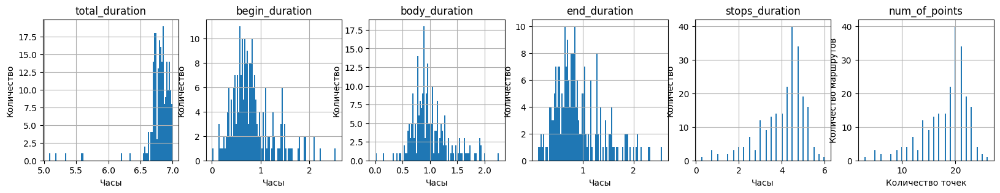

In [132]:
base_to_base_routes_calc.hists()

#### Маршруты "от БАЗЫ до последней точки" (от Славы)

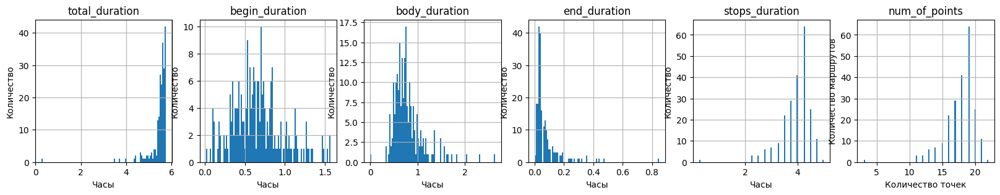

In [133]:
base_to_end_routes_calc.hists()

#### Маршруты "от базы о БАЗЫ" (от Славы)

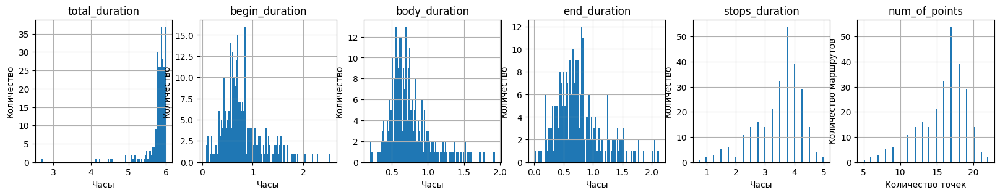

In [134]:
base_to_base_slava_routes_calc.hists()

#### Вывод по распределениям

__От базы к базе (метод ближайшего соседа)__
- Все маршруты очень близко к граничным условиям (что позволяет вместить больше точек в маршрут).
- Присутствует некритичная вариативность общей длительности маршрутов
- Достаточно сбалансированый маршрут

__От базы к любой точке (от Славы. Hybrid Genetic Search for the CVRP)__
- Очень плотное распределение общей длительности, но не дотягивает до условия 6-7 часов, что не позволяет плотно упаковать маршруты
- Есть дисбаланс между длительностями из первой/в последнюю точки и общим телом маршрута

__От базы к базе (от Славы. Hybrid Genetic Search for the CVRP)__
- Также плотное распределение длительности, но с недотягом до условий
- Достаточно сбалансированый маршрут

# Общий вывод и рекомендации

__Вывод__
1. Лучший метод по времени выполнения: __Метод ближайшего соседа__ (2.5 секунды для 3714 точек против 40 минут у Hybrid Genetic Search for the CVRP)
2. Лучший по экономичности – от базы в НЕ базовую точку (222 маршрута против 229 у Метода ближайшего соседа)

__Рекомендации:__
1. Разбить маршруты на кластеры (по разным критериям, удобным бизнесу: расстояние от базы, географические условия и тд)
2. Дальнейшие манипуляции проводить над кластерами
3. При составлении маршрутов сначала выбрать точки, в которых есть возвраты и понадобится вернуться в базовую точку – и построить для них маршруты методом ближайшего соседа
4. Остальные маршруты (без необходимости возврата на базу) считать методом Hybrid Genetic Search for the CVRP
5. Эти рекомендации позволят сильно сократить время вычислений (возможно на порядок)